# FOREIGN CURRENCY KAGGLE PROJECT

## PHASE 1: PROJECT SETUP

Import the necessary libraries needed for ETL, engineering, and export efforts

In [199]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [200]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
import time as t
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import getpass as gp

from shapely.geometry import Point, Polygon

In [201]:
program_start = t.time()

Function declaration

In [202]:
def function_1():
    '''
    DESCRIPTION: Sample description for the function
    '''

In [203]:
def function_2():
    '''
    DESCRIPTION: Sample description for the function
    '''

In [204]:
# set the random seed for the project in order to ensure consistent results
random.seed(6)

## PHASE 2: DATA ETL

## listings_2.csv Import

In [205]:
# import listings-2.csv into pandas dataframe
raw_df = pd.read_csv("data/Foreign_Exchange_Rates.csv") 
raw_df.head(10)

,Unnamed: 0,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,...,1.6563,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97
1,1,2000-01-04,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,...,1.6535,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13
2,2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,...,1.656,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1
3,3,2000-01-06,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,...,1.6655,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62
4,4,2000-01-07,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,...,1.6625,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3
5,5,2000-01-10,1.5242,0.9754,1.935,0.6107,1.819,1.4568,8.2794,7.7785,...,1.6618,7.254,105.28,3.8,8.024,8.449,73.3,1.5704,30.83,37.27
6,6,2000-01-11,1.5209,0.9688,1.9365,0.6068,1.8225,1.457,8.2795,7.7785,...,1.669,7.214,106.09,3.8,7.969,8.397,73.35,1.5605,30.83,37.61
7,7,2000-01-12,1.5202,0.9727,1.9286,0.6073,1.835,1.455,8.2796,7.7787,...,1.669,7.236,105.76,3.8,7.977,8.418,73.35,1.566,30.8,37.54
8,8,2000-01-13,1.4954,0.9737,1.9084,0.6067,1.814,1.4495,8.2798,7.7788,...,1.67,7.252,106.09,3.8,7.9425,8.417,73.35,1.5707,30.8,37.49
9,9,2000-01-14,1.5004,0.9874,1.9186,0.6115,1.805,1.4497,8.2797,7.7789,...,1.6752,7.347,105.86,3.8,7.997,8.474,73.35,1.5945,30.83,37.55


Drop the 'Unamed: 0' column from the raw dataframe

In [206]:
raw_df = raw_df.drop(['Unnamed: 0'], axis=1)

Rename the 'Time Serie' column to 'dtg' (datetime group)

In [207]:
raw_df.rename(columns = {'Time Serie':'dtg'}, inplace = True) 
raw_df.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,43.55,...,1.6563,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,43.55,...,1.656,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1
3,2000-01-06,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3


Set the dtg column as the index for the dataframe

In [208]:
raw_df = raw_df.set_index('dtg').reset_index()
raw_df.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,43.55,...,1.6563,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,43.55,...,1.656,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1
3,2000-01-06,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3


Get data type for each column

In [209]:
raw_df.dtypes

dtg                                          object
AUSTRALIA - AUSTRALIAN DOLLAR/US$            object
EURO AREA - EURO/US$                         object
NEW ZEALAND - NEW ZELAND DOLLAR/US$          object
UNITED KINGDOM - UNITED KINGDOM POUND/US$    object
BRAZIL - REAL/US$                            object
CANADA - CANADIAN DOLLAR/US$                 object
CHINA - YUAN/US$                             object
HONG KONG - HONG KONG DOLLAR/US$             object
INDIA - INDIAN RUPEE/US$                     object
KOREA - WON/US$                              object
MEXICO - MEXICAN PESO/US$                    object
SOUTH AFRICA - RAND/US$                      object
SINGAPORE - SINGAPORE DOLLAR/US$             object
DENMARK - DANISH KRONE/US$                   object
JAPAN - YEN/US$                              object
MALAYSIA - RINGGIT/US$                       object
NORWAY - NORWEGIAN KRONE/US$                 object
SWEDEN - KRONA/US$                           object
SRI LANKA - 

Remove rows with there is a non-numerical value

In [210]:
cond1 = raw_df['AUSTRALIA - AUSTRALIAN DOLLAR/US$'] != 'ND'
cond2 = raw_df['INDIA - INDIAN RUPEE/US$'] != 'ND'
cond3 = raw_df['TAIWAN - NEW TAIWAN DOLLAR/US$'] != 'ND'

mod_df = raw_df[cond1 & cond2 & cond3]
mod_df.head(15)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,43.55,...,1.6563,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,43.55,...,1.656,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1
3,2000-01-06,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3
5,2000-01-10,1.5242,0.9754,1.935,0.6107,1.819,1.4568,8.2794,7.7785,43.55,...,1.6618,7.254,105.28,3.8,8.024,8.449,73.3,1.5704,30.83,37.27
6,2000-01-11,1.5209,0.9688,1.9365,0.6068,1.8225,1.457,8.2795,7.7785,43.6,...,1.669,7.214,106.09,3.8,7.969,8.397,73.35,1.5605,30.83,37.61
7,2000-01-12,1.5202,0.9727,1.9286,0.6073,1.835,1.455,8.2796,7.7787,43.6,...,1.669,7.236,105.76,3.8,7.977,8.418,73.35,1.566,30.8,37.54
8,2000-01-13,1.4954,0.9737,1.9084,0.6067,1.814,1.4495,8.2798,7.7788,43.55,...,1.67,7.252,106.09,3.8,7.9425,8.417,73.35,1.5707,30.8,37.49
9,2000-01-14,1.5004,0.9874,1.9186,0.6115,1.805,1.4497,8.2797,7.7789,43.55,...,1.6752,7.347,105.86,3.8,7.997,8.474,73.35,1.5945,30.83,37.55


Convert all currency columns to float data type 

In [211]:
df = mod_df.iloc[:,2:].apply(pd.to_numeric)
df.dtypes

EURO AREA - EURO/US$                         float64
NEW ZEALAND - NEW ZELAND DOLLAR/US$          float64
UNITED KINGDOM - UNITED KINGDOM POUND/US$    float64
BRAZIL - REAL/US$                            float64
CANADA - CANADIAN DOLLAR/US$                 float64
CHINA - YUAN/US$                             float64
HONG KONG - HONG KONG DOLLAR/US$             float64
INDIA - INDIAN RUPEE/US$                     float64
KOREA - WON/US$                              float64
MEXICO - MEXICAN PESO/US$                    float64
SOUTH AFRICA - RAND/US$                      float64
SINGAPORE - SINGAPORE DOLLAR/US$             float64
DENMARK - DANISH KRONE/US$                   float64
JAPAN - YEN/US$                              float64
MALAYSIA - RINGGIT/US$                       float64
NORWAY - NORWEGIAN KRONE/US$                 float64
SWEDEN - KRONA/US$                           float64
SRI LANKA - SRI LANKAN RUPEE/US$             float64
SWITZERLAND - FRANC/US$                      f

In [212]:
mod_df['dtg'] = mod_df['dtg'].astype('datetime64[ns]')

/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [213]:

convert_dict = {'AUSTRALIA - AUSTRALIAN DOLLAR/US$': float,
                'EURO AREA - EURO/US$': float,
                'NEW ZEALAND - NEW ZELAND DOLLAR/US$': float, 
                'UNITED KINGDOM - UNITED KINGDOM POUND/US$': float,
                'BRAZIL - REAL/US$': float,                        
                'CANADA - CANADIAN DOLLAR/US$': float,             
                'CHINA - YUAN/US$': float,                         
                'HONG KONG - HONG KONG DOLLAR/US$': float,         
                'INDIA - INDIAN RUPEE/US$': float,                 
                'KOREA - WON/US$': float,                          
                'MEXICO - MEXICAN PESO/US$': float,                
                'SOUTH AFRICA - RAND/US$': float,                  
                'SINGAPORE - SINGAPORE DOLLAR/US$': float,         
                'DENMARK - DANISH KRONE/US$': float,               
                'JAPAN - YEN/US$': float,                          
                'MALAYSIA - RINGGIT/US$': float,                   
                'NORWAY - NORWEGIAN KRONE/US$': float,             
                'SWEDEN - KRONA/US$': float,                       
                'SRI LANKA - SRI LANKAN RUPEE/US$': float,         
                'SWITZERLAND - FRANC/US$': float,                  
                'TAIWAN - NEW TAIWAN DOLLAR/US$': float,           
                'THAILAND - BAHT/US$': float                      
               } 


mod_df = mod_df.astype(convert_dict) 
print(mod_df.dtypes)


dtg                                          datetime64[ns]
AUSTRALIA - AUSTRALIAN DOLLAR/US$                   float64
EURO AREA - EURO/US$                                float64
NEW ZEALAND - NEW ZELAND DOLLAR/US$                 float64
UNITED KINGDOM - UNITED KINGDOM POUND/US$           float64
BRAZIL - REAL/US$                                   float64
CANADA - CANADIAN DOLLAR/US$                        float64
CHINA - YUAN/US$                                    float64
HONG KONG - HONG KONG DOLLAR/US$                    float64
INDIA - INDIAN RUPEE/US$                            float64
KOREA - WON/US$                                     float64
MEXICO - MEXICAN PESO/US$                           float64
SOUTH AFRICA - RAND/US$                             float64
SINGAPORE - SINGAPORE DOLLAR/US$                    float64
DENMARK - DANISH KRONE/US$                          float64
JAPAN - YEN/US$                                     float64
MALAYSIA - RINGGIT/US$                  

In [214]:
# create a list of column names
col_list = list(raw_df.columns)
col_list

['dtg',
 'AUSTRALIA - AUSTRALIAN DOLLAR/US$',
 'EURO AREA - EURO/US$',
 'NEW ZEALAND - NEW ZELAND DOLLAR/US$',
 'UNITED KINGDOM - UNITED KINGDOM POUND/US$',
 'BRAZIL - REAL/US$',
 'CANADA - CANADIAN DOLLAR/US$',
 'CHINA - YUAN/US$',
 'HONG KONG - HONG KONG DOLLAR/US$',
 'INDIA - INDIAN RUPEE/US$',
 'KOREA - WON/US$',
 'MEXICO - MEXICAN PESO/US$',
 'SOUTH AFRICA - RAND/US$',
 'SINGAPORE - SINGAPORE DOLLAR/US$',
 'DENMARK - DANISH KRONE/US$',
 'JAPAN - YEN/US$',
 'MALAYSIA - RINGGIT/US$',
 'NORWAY - NORWEGIAN KRONE/US$',
 'SWEDEN - KRONA/US$',
 'SRI LANKA - SRI LANKAN RUPEE/US$',
 'SWITZERLAND - FRANC/US$',
 'TAIWAN - NEW TAIWAN DOLLAR/US$',
 'THAILAND - BAHT/US$']

In [215]:
mod_df.head(10)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,...,1.6563,7.3290,101.70,3.8,7.9640,8.4430,72.30,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.2180,103.09,3.8,7.9340,8.3600,72.65,1.5565,30.60,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,...,1.6560,7.2080,103.77,3.8,7.9350,8.3530,72.95,1.5526,30.80,37.10
3,2000-01-06,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.9400,8.3675,72.95,1.5540,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.9660,8.4150,73.15,1.5623,30.85,37.30
5,2000-01-10,1.5242,0.9754,1.9350,0.6107,1.8190,1.4568,8.2794,7.7785,43.55,...,1.6618,7.2540,105.28,3.8,8.0240,8.4490,73.30,1.5704,30.83,37.27
6,2000-01-11,1.5209,0.9688,1.9365,0.6068,1.8225,1.4570,8.2795,7.7785,43.60,...,1.6690,7.2140,106.09,3.8,7.9690,8.3970,73.35,1.5605,30.83,37.61
7,2000-01-12,1.5202,0.9727,1.9286,0.6073,1.8350,1.4550,8.2796,7.7787,43.60,...,1.6690,7.2360,105.76,3.8,7.9770,8.4180,73.35,1.5660,30.80,37.54
8,2000-01-13,1.4954,0.9737,1.9084,0.6067,1.8140,1.4495,8.2798,7.7788,43.55,...,1.6700,7.2520,106.09,3.8,7.9425,8.4170,73.35,1.5707,30.80,37.49
9,2000-01-14,1.5004,0.9874,1.9186,0.6115,1.8050,1.4497,8.2797,7.7789,43.55,...,1.6752,7.3470,105.86,3.8,7.9970,8.4740,73.35,1.5945,30.83,37.55


# PHASE 3: EXPLORATION

## Timeseries Plotting

In [216]:
mod_df.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,...,1.6563,7.3290,101.70,3.8,7.964,8.4430,72.30,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.2180,103.09,3.8,7.934,8.3600,72.65,1.5565,30.60,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,...,1.6560,7.2080,103.77,3.8,7.935,8.3530,72.95,1.5526,30.80,37.10
3,2000-01-06,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.940,8.3675,72.95,1.5540,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.966,8.4150,73.15,1.5623,30.85,37.30


In [217]:
# retrieve only the first day of the month record
first_day_mask = mod_df['dtg'].map(lambda x: x.day) == 1
first_day_df = mod_df[first_day_mask]
first_day_df

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
21,2000-02-01,1.5835,1.0276,2.0392,0.6192,1.7950,1.4468,8.2774,7.7807,43.62,...,1.6990,7.6445,107.67,3.8000,8.2770,8.7680,73.55,1.6540,31.75,37.51
42,2000-03-01,1.6483,1.0309,2.0606,0.6310,1.7690,1.4470,8.2786,7.7824,43.63,...,1.7182,7.6730,107.10,3.8000,8.3115,8.6865,73.75,1.6568,30.75,38.11
85,2000-05-01,1.7241,1.0965,2.0683,0.6428,1.8070,1.4783,8.2799,7.7890,43.67,...,1.7090,8.1695,108.89,3.8000,8.9050,8.9183,74.40,1.7135,30.65,38.12
108,2000-06-01,1.7479,1.0745,2.1925,0.6705,1.8210,1.4910,8.2771,7.7920,44.65,...,1.7320,8.0225,108.74,3.8000,8.9400,8.9680,75.30,1.6878,30.90,39.19
151,2000-08-01,1.7227,1.0837,2.1997,0.6670,1.7860,1.4892,8.2788,7.7993,45.15,...,1.7320,8.0840,109.47,3.8000,8.8850,9.2170,78.45,1.6758,31.15,41.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5042,2019-05-01,1.4209,0.8892,1.5033,0.7639,3.9195,1.3417,6.7319,7.8448,69.52,...,1.3586,6.6394,111.18,4.1320,8.6371,9.4968,176.00,1.0137,30.89,31.91
5085,2019-07-01,1.4362,0.8844,1.4981,0.7909,3.8217,1.3124,6.8487,7.8127,68.87,...,1.3566,6.6006,108.42,4.1334,8.5733,9.3364,176.20,0.9864,30.97,30.64
5108,2019-08-01,1.4582,0.9040,1.5235,0.8234,3.8366,1.3202,6.8972,7.8266,69.00,...,1.3720,6.7501,108.28,4.1423,8.8706,9.6492,176.44,0.9938,31.15,30.83
5151,2019-10-01,1.4919,0.9147,1.6010,0.8169,4.1624,1.3235,7.1473,7.8425,71.11,...,1.3851,6.8288,107.70,4.1920,9.1192,9.8791,182.20,0.9936,31.07,30.61


In [218]:
# create a list of currecy names
currency_list = list(mod_df.columns[1:])
currency_list

['AUSTRALIA - AUSTRALIAN DOLLAR/US$',
 'EURO AREA - EURO/US$',
 'NEW ZEALAND - NEW ZELAND DOLLAR/US$',
 'UNITED KINGDOM - UNITED KINGDOM POUND/US$',
 'BRAZIL - REAL/US$',
 'CANADA - CANADIAN DOLLAR/US$',
 'CHINA - YUAN/US$',
 'HONG KONG - HONG KONG DOLLAR/US$',
 'INDIA - INDIAN RUPEE/US$',
 'KOREA - WON/US$',
 'MEXICO - MEXICAN PESO/US$',
 'SOUTH AFRICA - RAND/US$',
 'SINGAPORE - SINGAPORE DOLLAR/US$',
 'DENMARK - DANISH KRONE/US$',
 'JAPAN - YEN/US$',
 'MALAYSIA - RINGGIT/US$',
 'NORWAY - NORWEGIAN KRONE/US$',
 'SWEDEN - KRONA/US$',
 'SRI LANKA - SRI LANKAN RUPEE/US$',
 'SWITZERLAND - FRANC/US$',
 'TAIWAN - NEW TAIWAN DOLLAR/US$',
 'THAILAND - BAHT/US$']

In [219]:
first_day_df.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
21,2000-02-01,1.5835,1.0276,2.0392,0.6192,1.795,1.4468,8.2774,7.7807,43.62,...,1.6990,7.6445,107.67,3.8,8.2770,8.7680,73.55,1.6540,31.75,37.51
42,2000-03-01,1.6483,1.0309,2.0606,0.6310,1.769,1.4470,8.2786,7.7824,43.63,...,1.7182,7.6730,107.10,3.8,8.3115,8.6865,73.75,1.6568,30.75,38.11
85,2000-05-01,1.7241,1.0965,2.0683,0.6428,1.807,1.4783,8.2799,7.7890,43.67,...,1.7090,8.1695,108.89,3.8,8.9050,8.9183,74.40,1.7135,30.65,38.12
108,2000-06-01,1.7479,1.0745,2.1925,0.6705,1.821,1.4910,8.2771,7.7920,44.65,...,1.7320,8.0225,108.74,3.8,8.9400,8.9680,75.30,1.6878,30.90,39.19
151,2000-08-01,1.7227,1.0837,2.1997,0.6670,1.786,1.4892,8.2788,7.7993,45.15,...,1.7320,8.0840,109.47,3.8,8.8850,9.2170,78.45,1.6758,31.15,41.09


In [220]:
working_df = mod_df.copy()
working_df.dtypes

dtg                                          datetime64[ns]
AUSTRALIA - AUSTRALIAN DOLLAR/US$                   float64
EURO AREA - EURO/US$                                float64
NEW ZEALAND - NEW ZELAND DOLLAR/US$                 float64
UNITED KINGDOM - UNITED KINGDOM POUND/US$           float64
BRAZIL - REAL/US$                                   float64
CANADA - CANADIAN DOLLAR/US$                        float64
CHINA - YUAN/US$                                    float64
HONG KONG - HONG KONG DOLLAR/US$                    float64
INDIA - INDIAN RUPEE/US$                            float64
KOREA - WON/US$                                     float64
MEXICO - MEXICAN PESO/US$                           float64
SOUTH AFRICA - RAND/US$                             float64
SINGAPORE - SINGAPORE DOLLAR/US$                    float64
DENMARK - DANISH KRONE/US$                          float64
JAPAN - YEN/US$                                     float64
MALAYSIA - RINGGIT/US$                  

## Plotly Graphs

Retrieve the working_df dataframe and plot a timeseries chart for each listed currency

In [221]:
working_df.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,...,1.6563,7.3290,101.70,3.8,7.964,8.4430,72.30,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,1.6535,7.2180,103.09,3.8,7.934,8.3600,72.65,1.5565,30.60,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,...,1.6560,7.2080,103.77,3.8,7.935,8.3530,72.95,1.5526,30.80,37.10
3,2000-01-06,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,...,1.6655,7.2125,105.19,3.8,7.940,8.3675,72.95,1.5540,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,...,1.6625,7.2285,105.17,3.8,7.966,8.4150,73.15,1.5623,30.85,37.30


In [222]:
currency_list

['AUSTRALIA - AUSTRALIAN DOLLAR/US$',
 'EURO AREA - EURO/US$',
 'NEW ZEALAND - NEW ZELAND DOLLAR/US$',
 'UNITED KINGDOM - UNITED KINGDOM POUND/US$',
 'BRAZIL - REAL/US$',
 'CANADA - CANADIAN DOLLAR/US$',
 'CHINA - YUAN/US$',
 'HONG KONG - HONG KONG DOLLAR/US$',
 'INDIA - INDIAN RUPEE/US$',
 'KOREA - WON/US$',
 'MEXICO - MEXICAN PESO/US$',
 'SOUTH AFRICA - RAND/US$',
 'SINGAPORE - SINGAPORE DOLLAR/US$',
 'DENMARK - DANISH KRONE/US$',
 'JAPAN - YEN/US$',
 'MALAYSIA - RINGGIT/US$',
 'NORWAY - NORWEGIAN KRONE/US$',
 'SWEDEN - KRONA/US$',
 'SRI LANKA - SRI LANKAN RUPEE/US$',
 'SWITZERLAND - FRANC/US$',
 'TAIWAN - NEW TAIWAN DOLLAR/US$',
 'THAILAND - BAHT/US$']

In [223]:
import plotly.graph_objects as go

for country_name in currency_list:
    chart_title = country_name + " Time Series Chart"
    y_title = country_name + " to USD conversion rate"
    x = working_df['dtg']
    y = working_df[country_name]
    fig = go.Figure(data=go.Scatter(x=x, y=y))
    fig.update_layout(title=chart_title,
                   xaxis_title='Date',
                   yaxis_title=y_title)
    fig.show()

### Boxplot Summaries

In [224]:
currency_df = mod_df.drop(['dtg'], axis=1)
currency_df.head(5)

,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,1128.0,...,1.6563,7.3290,101.70,3.8,7.964,8.4430,72.30,1.5808,31.38,36.97
1,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,1122.5,...,1.6535,7.2180,103.09,3.8,7.934,8.3600,72.65,1.5565,30.60,37.13
2,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,1135.0,...,1.6560,7.2080,103.77,3.8,7.935,8.3530,72.95,1.5526,30.80,37.10
3,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,1146.5,...,1.6655,7.2125,105.19,3.8,7.940,8.3675,72.95,1.5540,31.75,37.62
4,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,1138.0,...,1.6625,7.2285,105.17,3.8,7.966,8.4150,73.15,1.5623,30.85,37.30


In [225]:
currency_df.describe()

,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
count,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,...,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000,5015.000000
mean,1.332160,0.844014,1.543820,0.640466,2.548483,1.230503,7.200544,7.782643,52.726249,1125.552552,...,1.480412,6.286814,106.589230,3.651129,7.076004,7.899849,119.116291,1.150475,31.764830,35.522574
std,0.269974,0.126826,0.337414,0.082562,0.724234,0.182136,0.820413,0.027551,9.678708,103.406953,...,0.189003,0.943430,13.211723,0.378635,1.226730,1.201841,25.352131,0.249145,1.671172,4.563843
min,0.906900,0.624600,1.134600,0.473800,1.537500,0.916800,6.040200,7.708500,38.480000,903.200000,...,1.200700,4.660500,75.720000,2.937000,4.946700,5.834600,72.300000,0.729600,28.500000,28.600000
25%,1.115200,0.751000,1.323800,0.587500,1.945650,1.055850,6.475550,7.756400,45.250000,1067.570000,...,1.342900,5.593550,100.080000,3.290500,5.996600,6.852700,100.380000,0.966800,30.350000,31.780000
50%,1.311300,0.815600,1.442600,0.636500,2.329100,1.237100,6.860000,7.780600,48.100000,1127.790000,...,1.408400,6.072500,109.020000,3.800000,6.785000,7.748300,112.300000,1.040300,31.730000,34.010000
75%,1.430400,0.900150,1.591200,0.692400,3.130000,1.335700,8.276500,7.799800,62.440000,1180.000000,...,1.679350,6.714850,116.815000,3.800000,8.279100,8.744300,132.650000,1.269150,32.980000,39.410000
max,2.071300,1.209200,2.551000,0.828700,4.259400,1.612800,8.280000,7.849900,74.330000,1570.100000,...,1.854000,9.005000,134.770000,4.496000,9.589000,11.027000,182.800000,1.825000,35.210000,45.820000


In [226]:
currency_col = list(currency_df.columns)
currency_col

['AUSTRALIA - AUSTRALIAN DOLLAR/US$',
 'EURO AREA - EURO/US$',
 'NEW ZEALAND - NEW ZELAND DOLLAR/US$',
 'UNITED KINGDOM - UNITED KINGDOM POUND/US$',
 'BRAZIL - REAL/US$',
 'CANADA - CANADIAN DOLLAR/US$',
 'CHINA - YUAN/US$',
 'HONG KONG - HONG KONG DOLLAR/US$',
 'INDIA - INDIAN RUPEE/US$',
 'KOREA - WON/US$',
 'MEXICO - MEXICAN PESO/US$',
 'SOUTH AFRICA - RAND/US$',
 'SINGAPORE - SINGAPORE DOLLAR/US$',
 'DENMARK - DANISH KRONE/US$',
 'JAPAN - YEN/US$',
 'MALAYSIA - RINGGIT/US$',
 'NORWAY - NORWEGIAN KRONE/US$',
 'SWEDEN - KRONA/US$',
 'SRI LANKA - SRI LANKAN RUPEE/US$',
 'SWITZERLAND - FRANC/US$',
 'TAIWAN - NEW TAIWAN DOLLAR/US$',
 'THAILAND - BAHT/US$']

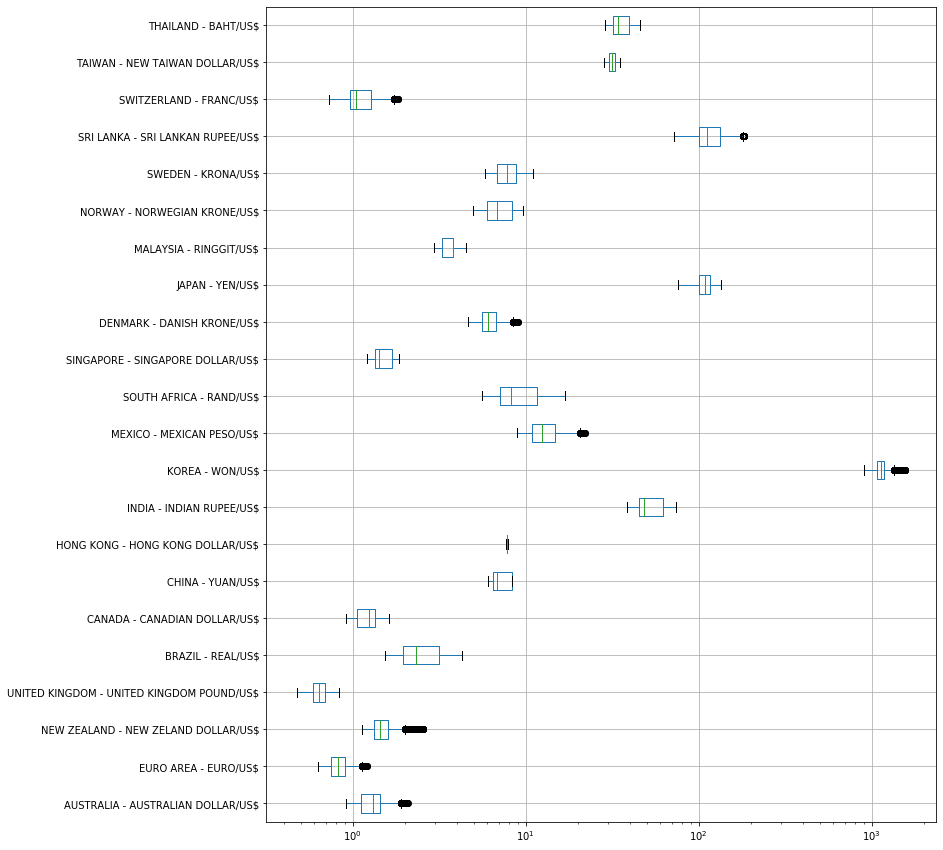

In [227]:
fig = plt.figure(figsize=(12, 15))
boxplot = currency_df.boxplot(column=currency_col, vert=0)
plt.xscale('log')
plt.autoscale(True)

## Correlation Analysis

Test section for correlation analysis with Euro and Australian dollar

In [228]:
x_values = [1,2,3]
y_values = [1,5,25]

correlation_matrix = np.corrcoef(x_values, y_values)
correlation_xy = correlation_matrix[0,1]
r_squared = correlation_xy**2

print(r_squared)

0.8709677419354838


In [229]:
currency_df.head(5)

,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,...,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,1128.0,...,1.6563,7.3290,101.70,3.8,7.964,8.4430,72.30,1.5808,31.38,36.97
1,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,1122.5,...,1.6535,7.2180,103.09,3.8,7.934,8.3600,72.65,1.5565,30.60,37.13
2,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,1135.0,...,1.6560,7.2080,103.77,3.8,7.935,8.3530,72.95,1.5526,30.80,37.10
3,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,1146.5,...,1.6655,7.2125,105.19,3.8,7.940,8.3675,72.95,1.5540,31.75,37.62
4,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,1138.0,...,1.6625,7.2285,105.17,3.8,7.966,8.4150,73.15,1.5623,30.85,37.30


In [230]:
currency_array = currency_df.to_numpy()
currency_array

array([[ 1.5172,  0.9847,  1.9033, ...,  1.5808, 31.38  , 36.97  ],
       [ 1.5239,  0.97  ,  1.9238, ...,  1.5565, 30.6   , 37.13  ],
       [ 1.5267,  0.9676,  1.9339, ...,  1.5526, 30.8   , 37.1   ],
       ...,
       [ 1.4331,  0.8949,  1.4919, ...,  0.9741, 30.09  , 30.14  ],
       [ 1.4278,  0.8915,  1.4846, ...,  0.9677, 30.04  , 29.94  ],
       [ 1.4225,  0.8907,  1.4826, ...,  0.9677, 29.91  , 29.75  ]])

In [231]:
aus = currency_array[:,0]
aus

array([1.5172, 1.5239, 1.5267, ..., 1.4331, 1.4278, 1.4225])

In [232]:
euro = currency_array[:,1]
euro

array([0.9847, 0.97  , 0.9676, ..., 0.8949, 0.8915, 0.8907])

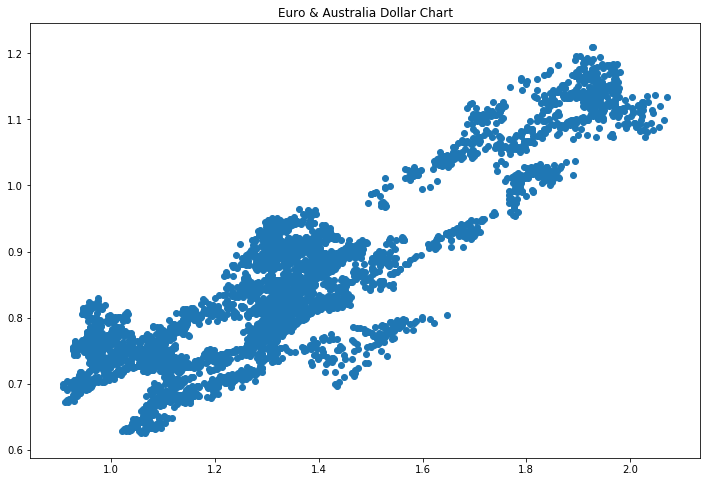

In [233]:
plt.figure(figsize = (12,8))
plt.title("Euro & Australia Dollar Chart")
plt.scatter(aus,euro)

In [234]:
aus_euro_corr_matrix = np.corrcoef(aus, euro)
correlation_xy = correlation_matrix[0,1]
r_squared = correlation_xy**2

print(r_squared)

0.8709677419354838


In [235]:
print(correlation_xy)

0.9332565252573827


In [236]:
print(aus_euro_corr_matrix)

[[1.         0.88463188]
 [0.88463188 1.        ]]


## Correlation Plot Charts Loop

In [237]:
row, column = currency_array.shape
corr_xy_list = []
r_squared_list = []

In [238]:

# Creating an empty Dataframe with column names only
matrix_df = pd.DataFrame(columns=['source_currency', 'target_currency', 'correlation', 'r_squared'])

In [239]:
corr_xy_list[:5]

[]

In [240]:
r_squared_list[:5]

[]

Display the matrix dataframe which possesses the correlation and r_square values

In [241]:
matrix_df

,source_currency,target_currency,correlation,r_squared


Sort the matrix dataframe by the correlation value column

In [242]:
matrix_df.sort_values(by=['correlation'], inplace=True, ascending = False)
matrix_df

,source_currency,target_currency,correlation,r_squared


# PHASE 4: TIMESERIES FORECASTING

## Australia Currency Test Section

### Condition the Australian currency dataset

In [243]:
aus_df = working_df.iloc[:, 0:2]
aus_df.set_index('dtg', inplace=True)
aus_df.index = pd.to_datetime(aus_df.index)
aus_df.head(10)

,AUSTRALIA - AUSTRALIAN DOLLAR/US$
dtg,
2000-01-03,1.5172
2000-01-04,1.5239
2000-01-05,1.5267
2000-01-06,1.5291
2000-01-07,1.5272
2000-01-10,1.5242
2000-01-11,1.5209
2000-01-12,1.5202
2000-01-13,1.4954


In [244]:
aus_df.dtypes

AUSTRALIA - AUSTRALIAN DOLLAR/US$    float64
dtype: object

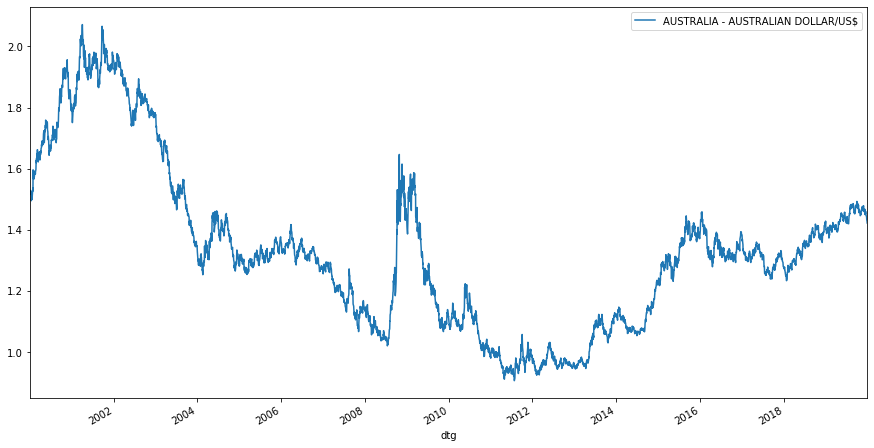

In [245]:
aus_df.plot(figsize = (15,8))

In [246]:
X = aus_df[['AUSTRALIA - AUSTRALIAN DOLLAR/US$']].to_numpy()
X[:5]

array([[1.5172],
       [1.5239],
       [1.5267],
       [1.5291],
       [1.5272]])

In [247]:
x_length = len(X)
train_length = len(X)*.8
test_length = x_length - train_length
print("Total size of dataset: {}".format(x_length))
print("Total size of train dataset: {}".format(train_length))
print("Total size of test dataset: {}".format(test_length))

Total size of dataset: 5015
Total size of train dataset: 4012.0
Total size of test dataset: 1003.0


In [248]:
train = X[:4012]
train

array([[1.5172],
       [1.5239],
       [1.5267],
       ...,
       [1.3943],
       [1.3829],
       [1.3848]])

In [249]:
test = X[4012:]

### ARIMA implementation

In [250]:
from statsmodels.tsa.arima_model import ARIMA

In [251]:
# parameters: p , d, q
# p = periods taken for autoregessive model
# d = order of integrated, number of times differences is executed
# q = periods in moving average model

model_arima = ARIMA(train, order = (5,1,0) )
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 4011
Model:                 ARIMA(5, 1, 0)   Log Likelihood               12154.362
Method:                       css-mle   S.D. of innovations              0.012
Date:                Wed, 22 Apr 2020   AIC                         -24294.724
Time:                        14:40:47   BIC                         -24250.647
Sample:                             1   HQIC                        -24279.102
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3.339e-05      0.000     -0.197      0.844      -0.000       0.000
ar.L1.D.y     -0.0495      0.016     -3.139      0.002      -0.080      -0.019
ar.L2.D.y      0.0037      0.016      0.236      0.8

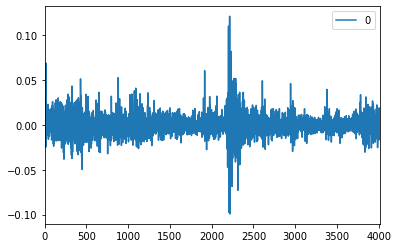

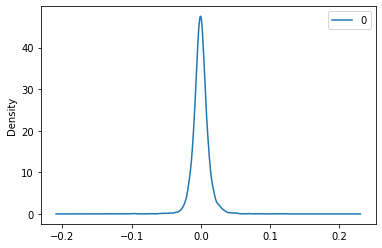

                  0
count  4.011000e+03
mean   1.812699e-07
std    1.168938e-02
min   -9.920570e-02
25%   -5.878789e-03
50%   -2.580107e-04
75%    5.343025e-03
max    1.207227e-01


In [252]:
from pandas import DataFrame

# plot residual errors
residuals = DataFrame(model_arima_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

<Figure size 864x576 with 0 Axes>

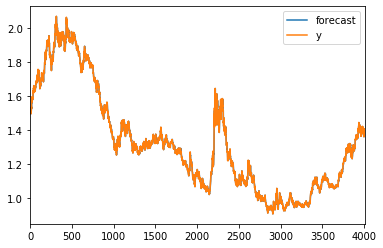

In [253]:
# Actual vs Fitted
plt.figure(figsize = (12,8))
model_arima_fit.plot_predict(dynamic=False)

plt.show()

### AIC Value Correction

In [254]:
import itertools
p=d=q=range(0,5)
pdq = list(itertools.product(p,d,q))
pdq[:10]

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4)]

In [255]:
for parameter in pdq:
    try:
        model_arima = ARIMA(train, order = parameter )
        model_arima_fit = model_arima.fit()
        print(parameter, model_arima_fit.aic)
    except:
        continue

(0, 0, 0) 1725.5775261827666
(0, 0, 1) -3616.648897450901
(0, 0, 2) -8024.675322668687
(0, 0, 3) -11337.741751342017
(0, 0, 4) -13718.748480712415
(0, 1, 0) -24264.613950182887
(0, 1, 1) -24274.63658966589
(0, 1, 2) -24272.79686218915
(0, 1, 3) -24279.359079939517
(0, 1, 4) -24288.822679579425
(0, 2, 0) -21263.02802216135
(0, 2, 1) -24238.199485009813
(0, 2, 2) -24248.98125560362
(0, 2, 3) -24246.294579925372
(0, 2, 4) -24254.509442190894
(1, 0, 0) -24264.618726577253
(1, 0, 1) -24274.48331209096
(1, 0, 2) -24272.66119986061
(1, 0, 3) -24279.103961792396
(1, 0, 4) -24288.702100624287
(1, 1, 0) -24274.820236952706
(1, 1, 1) -24282.998646196786
(1, 2, 0) -22593.312214995254
(1, 2, 1) -24255.241910991856
(1, 2, 2) -24262.989229681698
(1, 2, 4) -24271.209636987398
(2, 0, 0) -24274.672824532114
(2, 0, 1) -24282.90891079884
(2, 1, 0) -24273.12998458067
(2, 1, 1) -24281.000532937323
(2, 1, 2) -24280.74559022367
(2, 2, 0) -22989.933538267906
(2, 2, 1) -24254.170931766195
(2, 2, 2) -24257.20339

/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



(3, 2, 1) -24264.396838144392


/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



(3, 2, 2) -24261.690114992613


/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



(3, 2, 3) -24225.7056654485
(3, 2, 4) -24234.451008966105
(4, 0, 0) -24281.385586718432
(4, 0, 1) -24289.580040314693
(4, 0, 2) -24298.97757372974
(4, 1, 0) -24289.81933070501
(4, 1, 1) -24291.355695992555
(4, 1, 2) -24300.79924273956
(4, 1, 3) -24303.7637482528
(4, 1, 4) -24289.781268070656
(4, 2, 0) -23504.866632728466
(4, 2, 1) -24267.688604362724
(4, 2, 2) -24263.80868527553
(4, 2, 3) -24262.606121375436
(4, 2, 4) -24260.604417268085


/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



### Forecast

In [256]:
import matplotlib.dates as mdates
reset_aus = aus_df.reset_index()

In [257]:
reset_aus['mdate'] = mdates.date2num(reset_aus.dtg.dt.to_pydatetime())

In [258]:
mod_aus_df = reset_aus[['dtg', 'AUSTRALIA - AUSTRALIAN DOLLAR/US$']]

In [259]:
train = aus_df[:4012]
test = aus_df[4012:]

In [260]:
model = ARIMA(train, order=(2, 1, 1))  
model_arima_fit = model.fit(disp=-1)  

/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



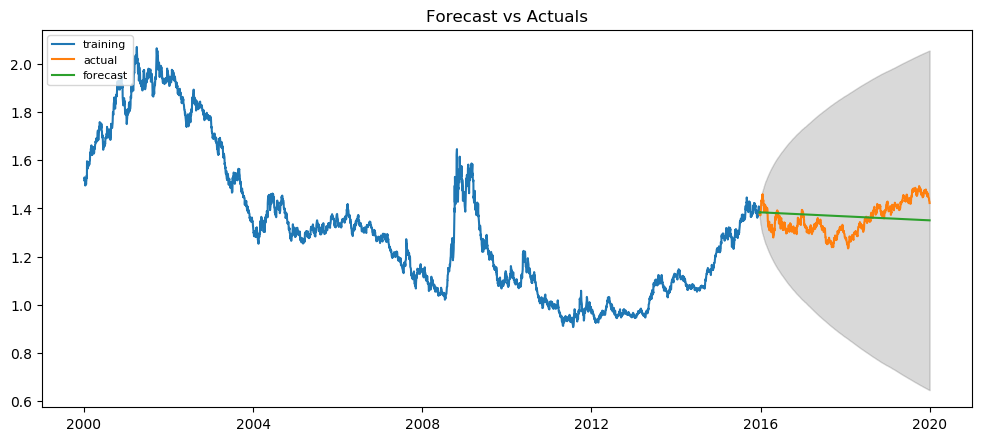

In [261]:
# Forecast
fc, se, conf = model_arima_fit.forecast(1003, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

## Change Point Detection

Declare change point detection functions

In [262]:
def roll_mean(array, window):
    mean_array = pd.Series(array).rolling(window).mean()
    return mean_array

In [263]:
def roll_std(array, window):
    std_array = pd.Series(array).rolling(window).std()
    return std_array

In [264]:
def roll_std2(array, window):
    std_array = pd.Series(array).rolling(window).std()
    return std_array*2

In [265]:
def roll_std3(array, window):
    std_array = pd.Series(array).rolling(window).std()
    return std_array*3

In [266]:
def roll_var(array, window):
    var_array = pd.Series(array).rolling(window).var()
    return var_array

In [267]:
aus_df.head(5)

,AUSTRALIA - AUSTRALIAN DOLLAR/US$
dtg,
2000-01-03,1.5172
2000-01-04,1.5239
2000-01-05,1.5267
2000-01-06,1.5291
2000-01-07,1.5272


In [268]:
detect_raw = aus_df.reset_index()
detect_raw.head(5)

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$
0,2000-01-03,1.5172
1,2000-01-04,1.5239
2,2000-01-05,1.5267
3,2000-01-06,1.5291
4,2000-01-07,1.5272


Slice out Australian column and convert to Numpy for speed optimization

In [269]:
temp_array = detect_raw[['AUSTRALIA - AUSTRALIAN DOLLAR/US$']].to_numpy()
aus_array = temp_array.flatten()
aus_array

array([1.5172, 1.5239, 1.5267, ..., 1.4331, 1.4278, 1.4225])

Calculate rolling mean of timeseries data with 7 day window

In [270]:
aus_mean = roll_mean(aus_array, 30)
aus_mean

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5010    1.463040
5011    1.462387
5012    1.461360
5013    1.459790
5014    1.458260
Length: 5015, dtype: float64

Calculate rolling standard deviation of timeseries data with 7 day window

In [271]:
aus_std = roll_std(aus_array, 30)
aus_std

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5010    0.009431
5011    0.010243
5012    0.011546
5013    0.012778
5014    0.014362
Length: 5015, dtype: float64

In [272]:
aus_std2 = roll_std2(aus_array, 30)
aus_std2

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5010    0.018862
5011    0.020485
5012    0.023093
5013    0.025557
5014    0.028723
Length: 5015, dtype: float64

In [273]:
aus_std3 = roll_std3(aus_array, 30)
aus_std3

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5010    0.028293
5011    0.030728
5012    0.034639
5013    0.038335
5014    0.043085
Length: 5015, dtype: float64

In [274]:
aus_var = roll_var(aus_array, 30)
aus_var

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5010    0.000089
5011    0.000105
5012    0.000133
5013    0.000163
5014    0.000206
Length: 5015, dtype: float64

In [275]:
.006144**2

3.7748736000000005e-05

In [276]:
detect_raw['roll_mean'] = aus_mean.tolist()

In [277]:
detect_raw['roll_std'] = aus_std.tolist()

In [278]:
detect_raw['roll_std2'] = aus_std2.tolist()

In [279]:
detect_raw['roll_std3'] = aus_std3.tolist()

In [280]:
detect_raw['roll_var'] = aus_var.tolist()

In [284]:
detect_raw['delta'] = detect_raw['AUSTRALIA - AUSTRALIAN DOLLAR/US$'] - detect_raw['roll_mean']

In [285]:
detect_raw[20:40]

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,roll_mean,roll_std,roll_std2,roll_std3,roll_var,delta
20,2000-02-01,1.5835,NaN,NaN,NaN,NaN,NaN,NaN
21,2000-02-02,1.5723,NaN,NaN,NaN,NaN,NaN,NaN
22,2000-02-03,1.5657,NaN,NaN,NaN,NaN,NaN,NaN
23,2000-02-04,1.5835,NaN,NaN,NaN,NaN,NaN,NaN
24,2000-02-07,1.5775,NaN,NaN,NaN,NaN,NaN,NaN
25,2000-02-08,1.5741,NaN,NaN,NaN,NaN,NaN,NaN
26,2000-02-09,1.5760,NaN,NaN,NaN,NaN,NaN,NaN
27,2000-02-10,1.5823,NaN,NaN,NaN,NaN,NaN,NaN
28,2000-02-11,1.5918,NaN,NaN,NaN,NaN,NaN,NaN
29,2000-02-14,1.5926,1.543073,0.032766,0.065532,0.098297,0.001074,0.049527


In [287]:
detect_raw['sigma_flag'] = np.where(detect_raw['delta'] > detect_raw['roll_std']
                     , True, False)

In [288]:
detect_raw['sigma2_flag'] = np.where(detect_raw['delta'] > detect_raw['roll_std2']
                     , True, False)

In [289]:
detect_raw['sigma3_flag'] = np.where(detect_raw['delta'] > detect_raw['roll_std3']
                     , True, False)

In [291]:
detect_raw[20:40]

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,roll_mean,roll_std,roll_std2,roll_std3,roll_var,delta,sigma_flag,sigma2_flag,sigma3_flag
20,2000-02-01,1.5835,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
21,2000-02-02,1.5723,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
22,2000-02-03,1.5657,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
23,2000-02-04,1.5835,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
24,2000-02-07,1.5775,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
25,2000-02-08,1.5741,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
26,2000-02-09,1.5760,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
27,2000-02-10,1.5823,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
28,2000-02-11,1.5918,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
29,2000-02-14,1.5926,1.543073,0.032766,0.065532,0.098297,0.001074,0.049527,True,False,False


In [292]:
sigma2_cond = detect_raw['sigma2_flag'] == True

sigma2_df = detect_raw[sigma2_cond]
sigma2_df

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$,roll_mean,roll_std,roll_std2,roll_std3,roll_var,delta,sigma_flag,sigma2_flag,sigma3_flag
69,2000-04-11,1.6787,1.645913,0.013968,0.027937,0.041905,0.000195,0.032787,True,True,False
73,2000-04-17,1.6912,1.649830,0.018199,0.036397,0.054596,0.000331,0.041370,True,True,False
82,2000-04-28,1.7132,1.666060,0.022304,0.044608,0.066913,0.000497,0.047140,True,True,False
83,2000-05-01,1.7241,1.668570,0.024430,0.048861,0.073291,0.000597,0.055530,True,True,False
93,2000-05-15,1.7425,1.691477,0.022335,0.044670,0.067005,0.000499,0.051023,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...
4911,2019-08-01,1.4582,1.434490,0.010766,0.021531,0.032297,0.000116,0.023710,True,True,False
4912,2019-08-02,1.4693,1.435277,0.012357,0.024715,0.037072,0.000153,0.034023,True,True,False
4913,2019-08-05,1.4749,1.436270,0.014230,0.028460,0.042690,0.000202,0.038630,True,True,False
4914,2019-08-06,1.4771,1.437640,0.016064,0.032127,0.048191,0.000258,0.039460,True,True,False


In [338]:
sigma3_cond = detect_raw['sigma3_flag'] == True

sigma3_df = detect_raw[sigma3_cond]
sigma3_df_sort.set_index('dtg')
sigma3_df_sort = sigma3_df.sort_values(by='dtg')
sigma3_df_final = sigma3_df_sort[['dtg', 'AUSTRALIA - AUSTRALIAN DOLLAR/US$']]

sigma3_df_final

/Users/patrickbenitez/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4244: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$
495,2001-12-20,1.9814
1560,2006-03-20,1.3845
1561,2006-03-21,1.3966
1917,2007-08-16,1.2723
2203,2008-10-06,1.4008
2205,2008-10-08,1.4948
2504,2009-12-17,1.1293
2599,2010-05-06,1.1187
2600,2010-05-07,1.1249
2608,2010-05-19,1.1933


In [318]:
detect_filter = detect_raw[['dtg', 'AUSTRALIA - AUSTRALIAN DOLLAR/US$']]
detect_filter.head(5)


,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$
0,2000-01-03,1.5172
1,2000-01-04,1.5239
2,2000-01-05,1.5267
3,2000-01-06,1.5291
4,2000-01-07,1.5272


In [341]:
result = pd.merge(detect_filter,
                 sigma3_df_final,
                 on='dtg', 
                 how='left')
result.fillna(method='ffill', inplace=True)
result

,dtg,AUSTRALIA - AUSTRALIAN DOLLAR/US$_x,AUSTRALIA - AUSTRALIAN DOLLAR/US$_y
0,2000-01-03,1.5172,NaN
1,2000-01-04,1.5239,NaN
2,2000-01-05,1.5267,NaN
3,2000-01-06,1.5291,NaN
4,2000-01-07,1.5272,NaN
...,...,...,...
5010,2019-12-24,1.4445,1.3812
5011,2019-12-26,1.4411,1.3812
5012,2019-12-27,1.4331,1.3812
5013,2019-12-30,1.4278,1.3812


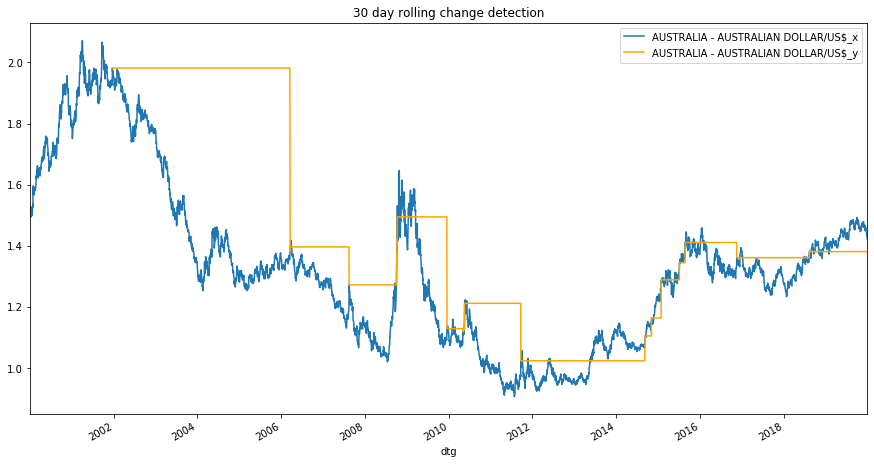

In [343]:
plt.figure(figsize = (15,8))
plt.title("30 day rolling change detection")
ax = plt.gca()
result.plot(kind='line',x='dtg',y='AUSTRALIA - AUSTRALIAN DOLLAR/US$_x',ax=ax)
result.plot(kind='line',x='dtg',y='AUSTRALIA - AUSTRALIAN DOLLAR/US$_y', color='orange', ax=ax)

plt.show()

In [344]:
import plotly.graph_objects as go

x = list(result.dtg)


fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x,
    y=list(result['AUSTRALIA - AUSTRALIAN DOLLAR/US$_x']),
    name = '<b>No</b> Gaps', # Style name/legend entry with html tags
    connectgaps=True # override default to connect the gaps
))
fig.add_trace(go.Scatter(
    x=x,
    y=list(result['AUSTRALIA - AUSTRALIAN DOLLAR/US$_y']),
    name='Gaps',
))

fig.show()

In [337]:
sigma3_df_final.dtypes

dtg                                  datetime64[ns]
AUSTRALIA - AUSTRALIAN DOLLAR/US$           float64
dtype: object

# PROGRAM END

In [180]:
program_end = t.time() - program_start
duration = round(program_end, 2)

print("Total time of program execution is {} seconds.".format(duration))

Total time of program execution is 80.21 seconds.
